# DS-7331 Machine Learning Project 3
## Airbnb Clustering Tasks
### Allen Miller, Ana Glaser, Jake Harrison, Lola Awodipe

https://nbviewer.jupyter.org/github/allenmiller17/SMU_7331_ML1_Projects/blob/main/PROJECT%203%20ML7331.ipynb

## Introduction

Our project utilizes Airbnb data from kaggle.com.

The main objective of this project is to perform cluster analyses to simply and potentially create more efficient classification models than the previous project.

### Table of Contents
0. Libraries and Loading Data
<br>
1. Business Understanding
    <br>
2. Data Understanding
    <br>
    2.1 Data Meaning
    <br>
    2.2 Data Quality
    <br>
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; 2.2.1 Missing Values
        <br>
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; 2.2.2 Outliers
    <br>
    2.3 Visualizing Important Features
    <br>
3. Modeling and Evaluation
    <br>
    3.1 KMeans Clustering Analysis
    <br>
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; 3.1.1 Selecting Optimal K-Clusters
        <br>
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; 3.1.2 Internal And External Validation Measures
        <br>
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; 3.1.3 Results
        <br>
    3.2 Hierichial Clustering Analysis
        <br>
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; 3.2.1 Selecting Optimal Clusters
        <br>
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; 3.2.2 Validation Measures
        <br>
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; 3.2.3 Models
        <br>
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; 3.2.4 Observations
        <br>
     3.3 DBScan Clustering Analysis
        <br>
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; 3.3.1 Selecting Optimal Clusters
        <br>
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; 3.3.2 Validation Measures and Results
        <br>
     3.4 Comparison of all Clustering Techniques
     <br>
     3.5 Visualize the results
     <br>
     3.6 Ramifications
     <br>
4. Deployment
<br>
5. Exceptional Work - Applying cluster analyses to Classification Models

### 0. Libraries and Loading Data

In [1]:
#loading libraries
import warnings
warnings.filterwarnings('ignore')

import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn import metrics

import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns

from sklearn.model_selection import train_test_split

import numpy as np
from scipy import stats

from sklearn import metrics as mt

from sklearn.cluster import KMeans

In [2]:
pdata = pd.read_csv("airbnb1.csv")

In [3]:
pdata.head()

,id,log_price,property_type,room_type,accommodates,bathrooms,bed_type,cancellation_policy,cleaning_fee,city,...,instant_bookable,last_review,latitude,longitude,neighbourhood,number_of_reviews,review_scores_rating,zipcode,bedrooms,beds
0,6901257,5.010635,Apartment,Entire home/apt,3,1.0,Real Bed,strict,True,NYC,...,f,7/18/2016,40.696524,-73.991617,Brooklyn Heights,2,100.0,11201,1.0,1.0
1,6304928,5.129899,Apartment,Entire home/apt,7,1.0,Real Bed,strict,True,NYC,...,t,9/23/2017,40.766115,-73.989040,Hell's Kitchen,6,93.0,10019,3.0,3.0
2,7919400,4.976734,Apartment,Entire home/apt,5,1.0,Real Bed,moderate,True,NYC,...,t,9/14/2017,40.808110,-73.943756,Harlem,10,92.0,10027,1.0,3.0
3,13418779,6.620073,House,Entire home/apt,4,1.0,Real Bed,flexible,True,SF,...,f,NaN,37.772004,-122.431619,Lower Haight,0,NaN,94117,2.0,2.0
4,3808709,4.744932,Apartment,Entire home/apt,2,1.0,Real Bed,moderate,True,DC,...,t,1/22/2017,38.925627,-77.034596,Columbia Heights,4,40.0,20009,0.0,1.0


In [4]:
pdata['property_type_original'] = pdata['property_type']

#transforming the property type to a binary classification
value_list = ["Apartment","House","Condominium","Townhouse","Loft"]
boolean_series = ~pdata.property_type.isin(value_list)
filtered_df = pdata[boolean_series]

filtered_df.head(100)

for i in list (filtered_df.index):
    pdata.loc[i,'property_type'] = "other"

#transforming the longitude and latitude variables to East / West
pdata["region"] = pd.cut(pdata.longitude,[-200,-100,0],2,labels=["West","East"])



### 1. Business Understanding

For our project, we decided to use AirBnb data from six major cities in the United States from kaggle.com. Our objective is to classify the type of property based on the data attributes like city, number of reviews, bathrooms, bedrooms and number of people it accommodates. 

First we will evaluate the various clustering techniques by visually inspecting the separation and interpretability of the clustering models. We will also compare the effectiveness of our clusters by evaluating the sillhouette score for each technique.  

Then we will append the clusters to the dataset as a feature to determine if the classification task is improved by these regressors.

To assess the effectiveness of our classification, we will look at the accuracy, precision, recall and evaluate the confusion matrix results.






### 2. Data Understanding


The number of reviews feature showed data that was heavily skewed to the left.  Because normality is not an assumption for clustering and classification tasks, we weren't worried about having a normal distribution for our feature observations, so we chose not to transform any of these variables.

The attribute of neighborhood made our data very sparse and it increased run time dramatically, when we tested the models with and without it, the difference was negligible, so the cost benefit of run time vs model performance seemed like a fair trade-off, so we eliminated that variable.

#### 2.1 Data Meaning

Adding the unlogged version of the price will help our team interpret the data and give us an idea on how dispersed our data really is.

In [5]:
pdata['price'] = np.exp(pdata.log_price)


In [6]:
pdata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30739 entries, 0 to 30738
Data columns (total 29 columns):
 #   Column                  Non-Null Count  Dtype   
---  ------                  --------------  -----   
 0   id                      30739 non-null  int64   
 1   log_price               30739 non-null  float64 
 2   property_type           30739 non-null  object  
 3   room_type               30739 non-null  object  
 4   accommodates            30739 non-null  int64   
 5   bathrooms               30645 non-null  float64 
 6   bed_type                30739 non-null  object  
 7   cancellation_policy     30739 non-null  object  
 8   cleaning_fee            30739 non-null  bool    
 9   city                    30739 non-null  object  
 10  description             30739 non-null  object  
 11  first_review            24150 non-null  object  
 12  host_has_profile_pic    30648 non-null  object  
 13  host_identity_verified  30648 non-null  object  
 14  host_response_rate    

In [7]:
pdata.skew()

id                     -0.259226
log_price               0.495235
accommodates            2.268456
bathrooms               3.705828
cleaning_fee           -1.047660
latitude               -0.537375
longitude              -0.404738
number_of_reviews       3.773445
review_scores_rating   -3.401681
bedrooms                1.995101
beds                    3.416529
price                   4.240231
dtype: float64

#### 2.2 Data Quality

##### 2.2.1 Missing Values

Given the volume of our data, we were able to reduce incomplete records with missing values and still retain a significant amount of records to evaluate.

In [8]:
pdata = pdata.dropna()


We also evaluated the number of unique values found in the categorical variables, we decided to eliminate the neighborhood attribute since it had 590 distinct values.  This made the model run time very slow and only gained a modest amount of accuracy.

In [9]:
pdata.nunique()

id                        17797
log_price                   519
property_type                 6
room_type                     3
accommodates                 16
bathrooms                    15
bed_type                      5
cancellation_policy           5
cleaning_fee                  2
city                          6
description               17736
first_review               2156
host_has_profile_pic          2
host_identity_verified        2
host_response_rate           71
host_since                 2776
instant_bookable              2
last_review                 861
latitude                  17794
longitude                 17790
neighbourhood               534
number_of_reviews           313
review_scores_rating         44
zipcode                     521
bedrooms                     10
beds                         16
property_type_original       29
region                        2
price                       519
dtype: int64

##### 2.2.2 Outliers

As displayed in the graphic below, the property type was a very skewed attribute, so we reduced it to the top 5 property types and the rest were labeled as other.

We also encoded the categorical variables that we were going to reserve for our classification models, and transformed the longitude variable to a region called east and west.

We then dropped all of the other columns that would not be used in the proceeding models, like property descriptions, and those that resulted lacking in predictive power, as demonstrated in our previous experiments.


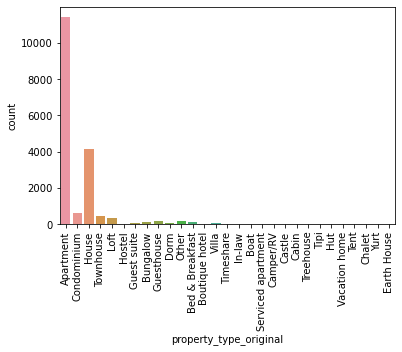

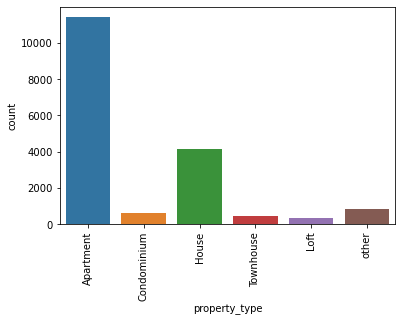

In [10]:
for i in ['property_type_original','property_type']:
    sns.countplot(pdata[i])
    plt.xticks(rotation=90)
    plt.show()

In [11]:
#creating a copy of the original data for reporting and future classification functions
pdata_all=pdata.copy()
pdata_cls=pdata.copy()

#Encoding boolean and categorical variables
replaceStruct = {
                "cleaning_fee":     {True: 1, False: 0},
                "instant_bookable":     {"t": 1, "f": 0},
                "host_identity_verified":     {"t": 1, "f": 0},
                "property_type":     {"Apartment": 0,"House": 1,"Condominium": 2,"Townhouse": 3,"Loft": 4, "other": 5},
                "region": {"East": 0, "West": 1},
                "room_type": {"Entire home/apt": 0, "Private room": 1, "Shared room": 2},
                "bed_type": {"Real Bed": 0, "Futon": 1, "Pull-out Sofa": 2, "Couch": 3, "Airbed": 4},
                "city": {"NYC": 0, "SF": 1, "DC": 2, "LA": 3, "Chicago": 4, "Boston": 5},
                "cancellation_policy": {"strict": 0, "moderate": 1, "flexible": 2, "super_strict_30": 3, "super_strict_60": 4}
                    }

pdata=pdata.replace(replaceStruct)
#pdata_cls=pdata.copy()


In [12]:
pdata.drop(['description','host_response_rate','first_review','host_since','last_review','zipcode','id','neighbourhood','host_has_profile_pic','cleaning_fee','instant_bookable','host_identity_verified','property_type','room_type','bed_type','cancellation_policy','city','region','longitude','latitude','property_type_original'], axis=1, inplace=True)


In [13]:
#evaluating the data after transformation
pdata.head()

,log_price,accommodates,bathrooms,number_of_reviews,review_scores_rating,bedrooms,beds,price
1,5.129899,7,1.0,6,93.0,3.0,3.0,169.0
2,4.976734,5,1.0,10,92.0,1.0,3.0,145.0
4,4.744932,2,1.0,4,40.0,0.0,1.0,115.0
5,4.442651,2,1.0,3,100.0,1.0,1.0,85.0
7,4.787492,2,1.0,9,93.0,1.0,1.0,120.0


### 2.3 Visualizing Important Features - Data Understanding 2

In [14]:
import plotly.express as px

Observing price across cities, one of our key regressors.  There does not appear to be signficant separation in property price between the various cities.

<AxesSubplot:xlabel='city', ylabel='log_price'>

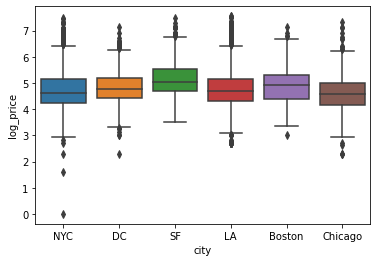

In [15]:
sns.boxplot(x='city', y='log_price', data=pdata_all)

Observing the data across properties, it is interesting to note that they all share the same distribution across key elements, the clusters in KMeans highlighted the commonalities in the property attributes.

In [82]:
# source https://plotly.com/python/

fig = px.scatter_3d(pdata_all, x='review_scores_rating', y='price', z='number_of_reviews', color='city', title="Viewing the average ratings, price, and number of reviews, colored by city")
fig.update_layout(margin=dict(l=0, r=0, b=50, t=100))
fig.show()

When plotting the data along number of bathrooms, beds and price, it formed a more circular shape, this was a more compact representation of the property types.  In the DBScan clustering, we were able to observe a similar delineation of the data according to its clusters.

In [83]:
fig = px.scatter_3d(pdata_all, x='bathrooms', y='beds', z='price', color='bathrooms', title="Viewing the number of bathrooms and beds with price colored by property type")
fig.update_layout(margin=dict(l=0, r=0, b=50, t=100))
fig.show()

### 3. Model and Evaluation 1 - Train and Adjust parameters

#### 3.1 K-Means Clustering Analysis

##### 3.1.1 Selecting Optimal K-Clusters

##### 3.1.1.1 Internal validation measures

There is room for intrepetation on which k is the best option. The elbow method is difficult to apply in this instance because there is not a specific point that the elbow starts. One could argue the elbow begins at 3, 6, 9, or 11. Due to that, our team decided to refer to the yellowbrick package which explicitly stated the optimal k was 6. This package, when used properly, will select an optimal k value based on the distortion score.

In [18]:
#Scale the data and deploy model

from scipy.stats import zscore

pdata_z = pdata.apply(zscore)

Text(0.5, 1.0, 'K Optimization Graph')

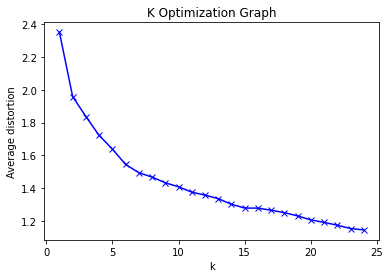

In [19]:
#https://medium.com/analytics-vidhya/how-to-determine-the-optimal-k-for-k-means-708505d204eb

from scipy.spatial.distance import cdist
clusters=range(1,25)
meanDistortions=[]

for k in clusters:
    model=KMeans(n_clusters=k, algorithm='auto',init='k-means++',n_jobs=20, random_state=2345)
    model.fit(pdata_z)
    prediction=model.predict(pdata_z)
    meanDistortions.append(sum(np.min(cdist(pdata_z, model.cluster_centers_, 'euclidean'), axis=1)) / pdata_z
                           .shape[0])


plt.plot(clusters, meanDistortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Average distortion')
plt.title('K Optimization Graph')

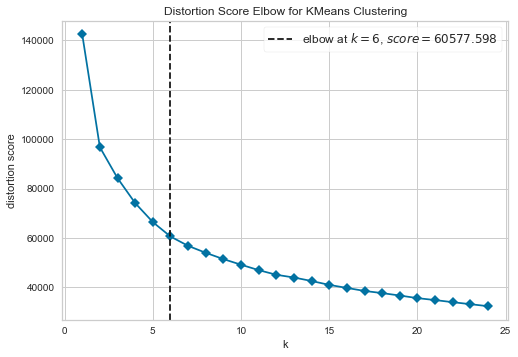

KElbowVisualizer(ax=<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>,
                 estimator=KMeans(n_clusters=24, n_jobs=20, random_state=2345),
                 k=None, timings=False)

In [20]:
#https://towardsdatascience.com/selecting-optimal-k-for-k-means-clustering-c7579fd2e926

from yellowbrick.cluster.elbow import kelbow_visualizer

kelbow_visualizer(model, pdata_z,k=(1,25),timings=False)

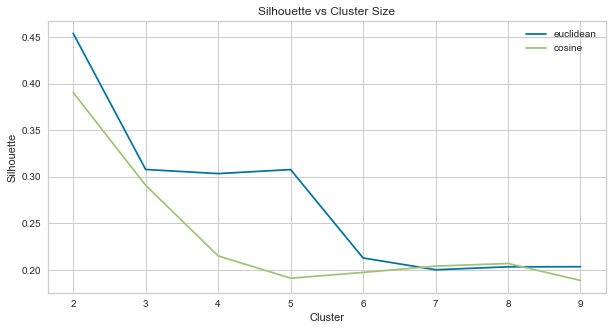

In [21]:
# referenced from class example
from sklearn import metrics
from sklearn.cluster import KMeans

seuclid = []
scosine = []
k = range(2,10)
for i in k:
    kmeans_model = KMeans(n_clusters=i, init="k-means++", random_state=2345).fit(pdata_z)
    labels = kmeans_model.labels_
    seuclid.append(metrics.silhouette_score(pdata_z, labels, metric='euclidean'))
    scosine.append(metrics.silhouette_score(pdata_z, labels, metric='cosine'))
    
plt.figure(figsize=(10,5))
plt.plot(k,seuclid,label='euclidean')
plt.plot(k,scosine,label='cosine')
plt.ylabel("Silhouette")
plt.xlabel("Cluster")
plt.title("Silhouette vs Cluster Size")
plt.legend()
plt.show()

In order to determine the optimal k clusters to use we compared the elbow graphic, the yellowbrick function vs the silhouette score per cluster chart, above.  We decided to move forward with 6 clusters although the silhouette score is greatest at 2, we have disregard this value because it is common knowledge that two clusters often result in a false positive recommendation. The next range of clusters is 3-5, but we didn't move forward with any of these clusters because the 6 clusters chosen by the yellowbrick package is optimized within an embedded logic (Reference 1).
<br>
<br>
Reference 1: https://medium.com/data-science-community-srm/machine-learning-visualizations-with-yellowbrick-3c533955b1b3

In [22]:
KNNModel = KMeans(n_clusters=6, n_init = 3, random_state=2345)
KNNModel.fit(pdata_z)
prediction=KNNModel.predict(pdata_z)


In [23]:
pdata['KCLUSTER']=prediction
pdata_all['KCLUSTER']=prediction
pdata_cls['KCLUSTER']=prediction

In [24]:
#Assess the distribution of clusters formed
pdata['KCLUSTER'].value_counts()  

1    6889
2    5030
4    2623
0    1587
3    1145
5     523
Name: KCLUSTER, dtype: int64

Evaluating the number of records per clusters, we feel the distribution is adequate among the various clusters.  We have appended the cluster value to the data for future evaluation and classification functions.

In [25]:
pdata.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 17797 entries, 1 to 30735
Data columns (total 9 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   log_price             17797 non-null  float64
 1   accommodates          17797 non-null  int64  
 2   bathrooms             17797 non-null  float64
 3   number_of_reviews     17797 non-null  int64  
 4   review_scores_rating  17797 non-null  float64
 5   bedrooms              17797 non-null  float64
 6   beds                  17797 non-null  float64
 7   price                 17797 non-null  float64
 8   KCLUSTER              17797 non-null  int32  
dtypes: float64(6), int32(1), int64(2)
memory usage: 1.9 MB


In [26]:
pdata.head()

,log_price,accommodates,bathrooms,number_of_reviews,review_scores_rating,bedrooms,beds,price,KCLUSTER
1,5.129899,7,1.0,6,93.0,3.0,3.0,169.0,4
2,4.976734,5,1.0,10,92.0,1.0,3.0,145.0,2
4,4.744932,2,1.0,4,40.0,0.0,1.0,115.0,3
5,4.442651,2,1.0,3,100.0,1.0,1.0,85.0,1
7,4.787492,2,1.0,9,93.0,1.0,1.0,120.0,1


##### 3.1.1.2 External validation measures

Intercluster distance displays an embedded cluster centers in a two-dimensions with the distance to the centers preserved. The cluster bubbles are sized by the number of instances within those groups. 

Just because there is overlap in the two-dimensional space, does not imply they overlap in the original feature space. However, looking at the three-dimensional graph of the selected features using plotly, one could argue against this notion.

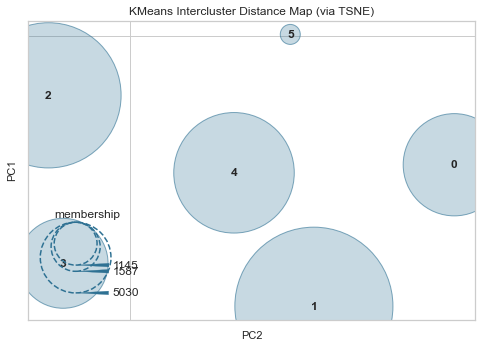

InterclusterDistance(ax=<AxesSubplot:title={'center':'KMeans Intercluster Distance Map (via TSNE)'}, xlabel='PC2', ylabel='PC1'>,
                     embedding='tsne',
                     estimator=KMeans(n_clusters=6, n_init=3,
                                      random_state=2345),
                     random_state=24)

In [27]:
#https://towardsdatascience.com/selecting-optimal-k-for-k-means-clustering-c7579fd2e926

from yellowbrick.cluster import intercluster_distance

intercluster_distance(KNNModel, pdata_z, embedding='tsne', random_state=24)

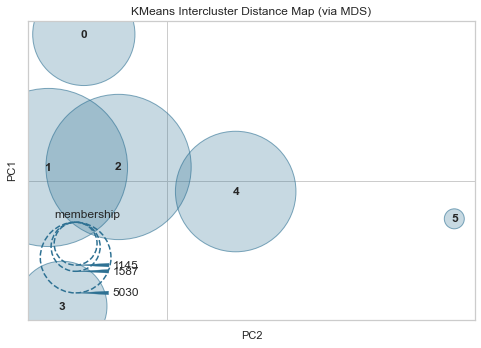

InterclusterDistance(ax=<AxesSubplot:title={'center':'KMeans Intercluster Distance Map (via MDS)'}, xlabel='PC2', ylabel='PC1'>,
                     estimator=KMeans(n_clusters=6, n_init=3,
                                      random_state=2345),
                     random_state=24)

In [28]:
intercluster_distance(KNNModel, pdata_z, embedding='mds', random_state=24)

#### 3.1.3 Results

In [29]:
Kmeans_results_analysis=round(pdata_all.groupby('KCLUSTER').mean(), ndigits=2)
Kmeans_results_analysis

,id,log_price,accommodates,bathrooms,cleaning_fee,latitude,longitude,number_of_reviews,review_scores_rating,bedrooms,beds,price
KCLUSTER,,,,,,,,,,,,
0,11120493.51,4.65,2.77,1.09,0.80,38.46,-95.13,142.46,94.24,0.96,1.47,114.91
1,11211867.71,4.24,1.97,1.10,0.77,38.78,-89.69,20.38,95.88,0.92,1.13,73.76
2,11258893.71,5.09,3.26,1.04,0.87,38.88,-90.79,21.03,96.13,1.08,1.63,172.13
3,11146419.13,4.46,2.73,1.18,0.76,38.90,-88.65,11.75,76.17,1.04,1.56,102.51
4,11266368.67,5.45,6.19,1.74,0.92,38.21,-95.36,27.20,94.37,2.38,3.33,261.97
5,11426179.37,6.34,10.00,3.01,0.94,37.35,-100.46,22.53,95.13,3.89,5.75,649.18


The clusters 3,5,0 and 1 show a clear separation and a relationship between price and review score rating.  For example, if we compare cluster 0 in purple to cluster 5 in green, they are both around the same price range but are separated by their rating.

If you compare clusters 2 and 4, the main distinction would be the number of reviews, those with more reviews are separated from the rest, despite having a similar price and rating.
<br>
<br>
Cluster 0 (yellow/orange) - medium price, high rating, high number of reviews
<br>
Cluster 1 (purple) - low price, high rating, low number of reviews
<br>
Cluster 2 (red) - medium-low price, high rating, low number of reviews
<br>
Cluster 3 (green) - low to medium-low price, lower rating, low number of reviews
<br>
Cluster 4 (dark blue) - medium-high price, high rating, low number of reviews
<br>
Cluster 5 (sky blue) - high price, high rating, low number of reviews

In [30]:
import plotly.express as px
pdata["strKCLUSTER"] = pdata["KCLUSTER"].astype(str)
fig = px.scatter_3d(pdata, x='review_scores_rating', y='price', z='number_of_reviews', color='strKCLUSTER', title="Comparing Scaled Reviews, Price, and Accomodations colored by Groups")
fig.update_layout(width = 550, height = 550,margin=dict(l=0, r=0, b=0, t=0))
fig.show()
#The number of ratings and the average rating relating to the price of the listing.

When observing the data across clusters, it was evident that city was not a distinguishing factor, as demonstrated in the boxplots below, the separation among clusters appears to be more pronounced along the price, rating and number of reviews.

In [31]:
fig05 = px.box(pdata_all, y="price", x="city", color="KCLUSTER", title ="Box Plot of the dataset comparing city price by clusters", height=1000, width=1500)
fig05.update_layout(margin=dict(l=1, r=650, b=100, t=100))
fig05.show()


In [32]:
fig06 = px.box(pdata_all, y="review_scores_rating", x="city", color="KCLUSTER", title ="Box Plot of Average Rating by Cluster", height=1000, width=1500)
fig06.update_layout(margin=dict(l=0, r=650, b=100, t=100))
fig06.show()

In [33]:
fig06 = px.box(pdata_all, y="number_of_reviews", x="city", color="KCLUSTER", title ="Box Plot of Reviews by Cluster", height=1000, width=1500)
fig06.update_layout(margin=dict(l=0, r=650, b=100, t=100))
fig06.show()

#### 3.2 Hierarchical Clustering Analysis

##### 3.2.1 Selecting Optimal Clusters

Selecting the optimal number of clusters in the hierarchical clusters is based on the height of the distance where one determines the best separation is represented.

##### 3.2.2 Validation Measures

We iterated through the various linkage techniques for the hierarchical clusters and compared the cophenetic scores.

We evaluated the following linkage methods:
single, which is the minimum distance between clusters, complete - which is the maximum distance, average - the average of the distances between all pairs, ward - minimum within cluster variance , median - which is the median distance between clusters. 

##### 3.2.3 Models

In [34]:
# https://joernhees.de/blog/2015/08/26/scipy-hierarchical-clustering-and-dendrogram-tutorial/

from scipy.cluster.hierarchy import cophenet, dendrogram, linkage
from scipy.spatial.distance import pdist  #Pairwise distribution between data points

In [35]:
from scipy.cluster.hierarchy import cophenet, dendrogram, linkage
from scipy.spatial.distance import pdist  #Pairwise distribution between data points

linkage_methods = ['single', 'complete', 'average', 'ward', 'median']

results_cophenetic_coef=[]

for i in linkage_methods :
    Z = linkage(pdata_z, i)
    cc, coph_dists = cophenet(Z , pdist(pdata_z))
    results_cophenetic_coef.append((i,cc))

In [36]:
results_cophenetic_coef_df=pd.DataFrame(results_cophenetic_coef,columns=['LinkageMethod','CopheneticCoefficient'])
results_cophenetic_coef_df

,LinkageMethod,CopheneticCoefficient
0,single,0.682061
1,complete,0.782919
2,average,0.868224
3,ward,0.477661
4,median,0.602575


We compared the cophenetic coefficient per linkage method above, we will now evaluate the clustering techniques visually in the dendograms below.

In [37]:
#hierarchical cluster with average linkage method
Z = linkage(pdata_z, metric='euclidean', method='average')
c, coph_dists = cophenet(Z , pdist(pdata_z))

c

0.8682238953815259

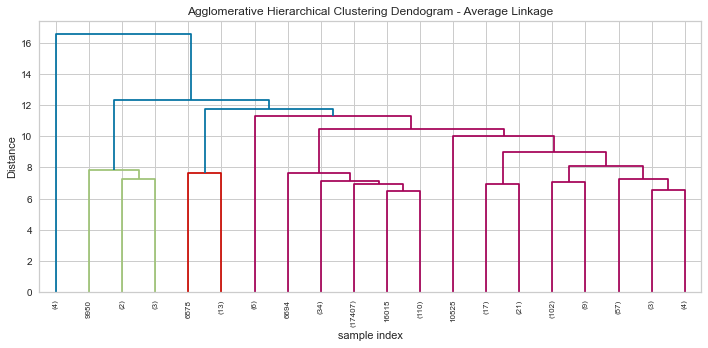

In [38]:
plt.figure(figsize=(10, 5))
plt.title('Agglomerative Hierarchical Clustering Dendogram - Average Linkage')
plt.xlabel('sample index')
plt.ylabel('Distance')
dendrogram(Z, leaf_rotation=90., leaf_font_size=8. , truncate_mode = 'lastp',p=20)
plt.tight_layout()

In [39]:
# hierarchical cluster with ward linkage method
Z1 = linkage(pdata_z, metric='euclidean', method='ward')
c1, coph_dists1 = cophenet(Z1 , pdist(pdata_z))

c1

0.4776610045765306

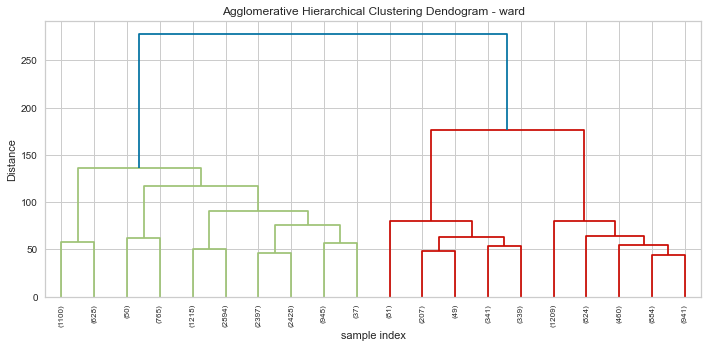

In [40]:
plt.figure(figsize=(10, 5))
plt.title('Agglomerative Hierarchical Clustering Dendogram - ward')
plt.xlabel('sample index')
plt.ylabel('Distance')
dendrogram(Z1, leaf_rotation=90., leaf_font_size=8. , truncate_mode = 'lastp',p=20)
plt.tight_layout()

We will now truncate the various hierarchical clusters to assign a cluster for visual representation

The distance range for the ward method is quite high compared to the average distance, we will truncate our clusters at distance = 100.  This will result in 5 clusters.

In [41]:
max_d=100
from scipy.cluster.hierarchy import fcluster
clusters = fcluster(Z1, max_d, criterion='distance')
set(clusters)



{1, 2, 3, 4, 5}

In [42]:
pdata['HierarchicalCluster_Ward']=clusters
pdata_all['HierarchicalCluster_Ward']=clusters
#pdata_cls['HierarchicalCluster_Ward']=clusters
#pdata_list['HierarchicalCluster_Ward']=clusters
#dataset['HierarchicalCluster_Ward']=clusters

In [43]:
#the hierarchical label is now appended to our data 
pdata.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 17797 entries, 1 to 30735
Data columns (total 11 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   log_price                 17797 non-null  float64
 1   accommodates              17797 non-null  int64  
 2   bathrooms                 17797 non-null  float64
 3   number_of_reviews         17797 non-null  int64  
 4   review_scores_rating      17797 non-null  float64
 5   bedrooms                  17797 non-null  float64
 6   beds                      17797 non-null  float64
 7   price                     17797 non-null  float64
 8   KCLUSTER                  17797 non-null  int32  
 9   strKCLUSTER               17797 non-null  object 
 10  HierarchicalCluster_Ward  17797 non-null  int32  
dtypes: float64(6), int32(2), int64(2), object(1)
memory usage: 2.1+ MB


In [78]:
import plotly.express as px
pdata["strHierarchicalCluster_Ward"] = pdata["HierarchicalCluster_Ward"].astype(str)
fig = px.scatter_3d(pdata, x='review_scores_rating', y='price', z='number_of_reviews', color='strHierarchicalCluster_Ward', title="Comparing Review Ratings, Price, and the number of reviews colored by Groups")
#fig.update_layout(width = 550, height = 550,margin=dict(l=0, r=0, b=0, t=0))
fig.show()
#The number of ratings and the average rating relating to the price of the listing.

In [45]:
#Assess the distribution of clusters formed using the ward linkage method
pdata['HierarchicalCluster_Ward'].value_counts()  

3    9919
5    4318
1    1728
4    1017
2     815
Name: HierarchicalCluster_Ward, dtype: int64

In [46]:
hierarchical_results_analysis=round(pdata_all.groupby('HierarchicalCluster_Ward').mean(), ndigits=2)
hierarchical_results_analysis

,id,log_price,accommodates,bathrooms,cleaning_fee,latitude,longitude,number_of_reviews,review_scores_rating,bedrooms,beds,price,KCLUSTER
HierarchicalCluster_Ward,,,,,,,,,,,,,
1,11309170.22,4.60,2.56,1.04,0.80,38.46,-94.75,130.24,94.11,0.88,1.35,108.83,0.31
2,10990111.40,4.36,2.45,1.04,0.76,38.93,-88.53,10.41,74.63,0.91,1.41,91.87,2.78
3,11213068.74,4.50,2.27,1.11,0.79,38.80,-90.03,19.64,95.79,0.88,1.21,101.26,1.37
4,11458670.01,6.12,8.77,2.43,0.93,37.71,-98.64,21.35,95.34,3.34,4.79,527.20,4.49
5,11216803.81,5.23,4.90,1.35,0.90,38.61,-92.76,27.51,94.38,1.94,2.66,207.70,2.91


The ward hierarchical linkage approach, which optimizes within cluster distance is most closely aligned with the separation we expect and very similar to the results we saw with k-means clustering.

### We will now evaluate the clusters when we apply the average linkage technique

In [47]:
max_d=11
from scipy.cluster.hierarchy import fcluster
clusters2 = fcluster(Z, max_d, criterion='distance')
set(clusters2)


{1, 2, 3, 4, 5}

In [48]:
pdata['HierarchicalCluster_Avg']=clusters2
pdata_all['HierarchicalCluster_Avg']=clusters2
#pdata_cls['HierarchicalCluster_Avg']=clusters2
#pdata_list['HierarchicalCluster_Avg']=clusters2

In [49]:
pdata['HierarchicalCluster_Avg'].value_counts()  

5    17767
3       14
4        6
2        6
1        4
Name: HierarchicalCluster_Avg, dtype: int64

In [79]:
import plotly.express as px
pdata["strHierarchicalCluster_Avg"] = pdata["HierarchicalCluster_Avg"].astype(str)
fig = px.scatter_3d(pdata, x='review_scores_rating', y='price', z='number_of_reviews', color='strHierarchicalCluster_Avg', title="Comparing Number of Reviews, Price, and Average Review Rating colored by Groups")
#fig.update_layout(width = 550, height = 550,margin=dict(l=0, r=0, b=0, t=0))
fig.show()
#The number of ratings and the average rating relating to the price of the listing.

In [51]:
hierarchical_results_analysis_avg=round(pdata_all.groupby('HierarchicalCluster_Avg').mean(), ndigits=2)
hierarchical_results_analysis_avg

,id,log_price,accommodates,bathrooms,cleaning_fee,latitude,longitude,number_of_reviews,review_scores_rating,bedrooms,beds,price,KCLUSTER,HierarchicalCluster_Ward
HierarchicalCluster_Avg,,,,,,,,,,,,,,
1,9793226.00,6.16,16.00,4.75,0.75,39.63,-91.91,23.50,95.50,9.00,15.00,505.50,5.00,4.0
2,9915977.33,4.30,11.50,1.58,0.33,34.01,-118.40,32.67,90.50,0.83,15.67,148.00,4.50,4.0
3,14996139.57,3.93,2.93,7.46,0.50,37.96,-95.42,30.21,90.71,0.86,3.14,56.64,4.07,3.0
4,7012494.50,6.04,7.00,2.42,0.83,36.55,-103.14,1.67,26.67,2.67,4.17,462.00,3.33,2.0
5,11226349.54,4.77,3.31,1.23,0.82,38.66,-91.56,31.98,94.32,1.27,1.78,151.62,1.88,3.3


##### 3.2.4 Observations - Hierarchical Clustering

After visually comparing the various hierarchical clustering results and evaluating the cophanetic index, we deteremined which clustering linkage method was more appropriate for our data.  

The ward linkage method clusters the data among common properties, which makes sense because it is optimizing for the within cluster distance.  The average linkage method clustered a majority of the datapoints together, and highlighted the anomaly.  

For example, the clusters that were outside of the main group, exhibited a rare combination of traits, like unusually small number of reviews or an extremely high price point.  We think average linkage is better for anomaly detection and ward linkage is more appropriate to find commonalities in the data.

#### 3.3 DBScan Clustering Analysis

We will now evaluate the DBScan clustering technique, we illustrated the eps points based on the min point value.

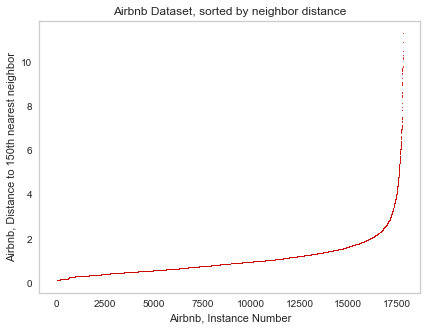

In [52]:
#from ICA 4 class example

from sklearn.neighbors import kneighbors_graph

db_minpts = 150

db_knn_graph = kneighbors_graph(pdata_z, db_minpts, mode = 'distance')

N2 = db_knn_graph.shape[0]
pdata_nn_distances = np.zeros((N2,1))
for i in range(N2):
    pdata_nn_distances[i] = db_knn_graph[i,:].max()
    
pdata_nn_distances = np.sort(pdata_nn_distances, axis=0)

plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.plot(range(N2), pdata_nn_distances, 'r.', markersize=2)
plt.title('Airbnb Dataset, sorted by neighbor distance')
plt.xlabel('Airbnb, Instance Number')
plt.ylabel('Airbnb, Distance to {0}th nearest neighbor'.format(db_minpts))
plt.grid()
plt.show()


Based on the graph above, we have optimized the eps value and determined the best min points is 2 and the best eps is closest to 1

In [53]:
from sklearn.cluster import DBSCAN

modelDBSCAN = DBSCAN(eps=.75, min_samples=150).fit(pdata_z)
labelsDBSCAN = modelDBSCAN.labels_


In [91]:

pdata['DBSCAN_Cluster']=labelsDBSCAN
pdata_all['DBSCAN_Cluster']=labelsDBSCAN
#pdata_cls['DBSCAN_Cluster']=labelsDBSCAN
#pdata_list['DBSCAN_Cluster']=labelsDBSCAN

In [93]:
pdata.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 17797 entries, 1 to 30735
Data columns (total 16 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   log_price                    17797 non-null  float64
 1   accommodates                 17797 non-null  int64  
 2   bathrooms                    17797 non-null  float64
 3   number_of_reviews            17797 non-null  int64  
 4   review_scores_rating         17797 non-null  float64
 5   bedrooms                     17797 non-null  float64
 6   beds                         17797 non-null  float64
 7   price                        17797 non-null  float64
 8   KCLUSTER                     17797 non-null  int32  
 9   strKCLUSTER                  17797 non-null  object 
 10  HierarchicalCluster_Ward     17797 non-null  int32  
 11  strHierarchicalCluster_Ward  17797 non-null  object 
 12  HierarchicalCluster_Avg      17797 non-null  int32  
 13  strHierarchicalC

In [55]:
pdata['DBSCAN_Cluster'].value_counts()  

-1    7775
 0    7154
 3    1376
 2     906
 1     435
 4     151
Name: DBSCAN_Cluster, dtype: int64

In [97]:
import plotly.express as px
pdata["strDBSCAN_Cluster"] = pdata["DBSCAN_Cluster"].astype(str)
fig = px.scatter_3d(pdata, x='accommodates', y='bedrooms', z='price', color='strDBSCAN_Cluster', title="Accomodations, Price, and Bedrooms colored by Groups")
fig.update_layout(margin=dict(l=0, r=0, b=100, t=50))
fig.show()
#The number of ratings and the average rating relating to the price of the listing.

In [106]:
pdata_nonneg = pdata[(pdata['DBSCAN_Cluster'] > -1)]
pdata_nonneg["strDBSCAN_Cluster"] = pdata_nonneg["DBSCAN_Cluster"].astype(str)
fig = px.scatter_3d(pdata_nonneg, x='accommodates', y='bedrooms', z='price', color='strDBSCAN_Cluster', title="Accomodations, Price, and Bedrooms colored by Groups without Group -1")
fig.update_layout(margin=dict(l=0, r=0, b=100, t=50))
fig.show()

When we look at the clusters, we can see a majority of the representation in the graphic is cluster '-1'. Once that is removed, then you can see a distinct separation of the clusters. This could be considered noise. Further clustering should be conducted within this space to determine what drives its commonality. It is interesting to note that the linkage method 'average' in the hierarchical clustering exhibited similar behavior.

In [57]:
dbscan_results_analysis_avg=round(pdata_all.groupby('DBSCAN_Cluster').mean(), ndigits=2)
dbscan_results_analysis_avg

,id,log_price,accommodates,bathrooms,cleaning_fee,latitude,longitude,number_of_reviews,review_scores_rating,bedrooms,beds,price,KCLUSTER,HierarchicalCluster_Ward,HierarchicalCluster_Avg
DBSCAN_Cluster,,,,,,,,,,,,,,,
-1,11219613.85,5.03,4.61,1.53,0.85,38.42,-93.66,43.54,92.32,1.69,2.58,207.16,2.54,3.69,4.99
0,11141116.59,4.48,2.02,1.00,0.78,38.92,-89.44,24.70,95.54,1.00,1.00,99.67,1.27,2.87,5.00
1,11381029.75,5.10,4.11,1.00,0.91,38.77,-93.38,14.03,97.61,2.00,2.00,171.52,2.00,5.00,5.00
2,11752569.58,4.75,2.12,1.00,0.85,38.36,-93.22,18.28,96.45,0.00,1.00,123.22,1.37,2.97,5.00
3,11291343.86,4.79,3.41,1.00,0.89,38.81,-89.34,21.26,96.01,1.00,2.00,130.49,1.73,3.07,5.00
4,11508152.96,4.25,1.83,1.50,0.80,38.68,-90.40,11.38,98.15,1.00,1.00,71.62,1.00,3.00,5.00


##### 3.3.1 Selecting Optimal Clusters

Evaluating the DBScan, we used a kneighbors graph to determine the optimal eps and min_points required.  Once we produced the ideal number of points, we visually evaluated the separation as identified by the DBSCAN clusters.  There appeared to be a distinct separation based on the number of room and how many people it accommodated.  This technique used a different set of properties to differentiate the data.

##### 3.3.2 Results and Validation Measures

Observing the silhouette score, we can see that it is very close to 0, but slightly on the negative side, this tell us that our clusters are overlapping.  We can observer this because upon visual inspection, we need to omit cluster -1 to show clear separation between the remaining clusters.  This indicates there is still room for improvement when applying the DBSCAN technique on our data, given the shape of the data DBSCAN favors, we would be more effective using a different clustering technique more geared towards our data.

In [58]:
#https://scikit-learn.org/stable/modules/generated/sklearn.cluster.DBSCAN.html

modelDBSCAN = DBSCAN(eps=.75, min_samples=150).fit(pdata_z)
labelsDBSCAN = modelDBSCAN.labels_


In [59]:
# referenced from class example

core_samples_mask = np.zeros_like(modelDBSCAN.labels_, dtype=bool)
core_samples_mask[modelDBSCAN.core_sample_indices_] = True
#labels = modelDBSCAN.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labelsDBSCAN)) - (1 if -1 in labelsDBSCAN else 0)
n_noise_ = list(labelsDBSCAN).count(-1)

print('Estimated number of clusters: %d' % n_clusters_)
print('Estimated number of noise points: %d' % n_noise_)
print("Silhouette Coefficient: %0.3f"
      % metrics.silhouette_score(pdata_z, labelsDBSCAN))


Estimated number of clusters: 5
Estimated number of noise points: 7775
Silhouette Coefficient: -0.132


In [60]:
pdata_z.head()

,log_price,accommodates,bathrooms,number_of_reviews,review_scores_rating,bedrooms,beds,price
1,0.532142,1.654262,-0.409032,-0.577731,-0.182671,1.997563,0.917106,0.123608
2,0.304644,0.756496,-0.409032,-0.488726,-0.324357,-0.320024,0.917106,-0.048163
4,-0.039654,-0.590154,-0.409032,-0.622234,-7.692046,-1.478818,-0.599854,-0.262876
5,-0.488636,-0.590154,-0.409032,-0.644485,0.809133,-0.320024,-0.599854,-0.477589
7,0.023561,-0.590154,-0.409032,-0.510977,-0.182671,-0.320024,-0.599854,-0.227090


### 3.4 Comparison of all Clustering Techniques - Model and Evaluation 2

When we visually compared the clusters using the 3D plots, we felt that the KMEANS clustering was the most effective technique to seperate our data.  However, when we evaluated the silhouette scores side-by-side, we noticed that the Hierarchical clustering had a better silhouette score, with DBSCAN's score representing most points it classified as "noise."

We then had an opportunity to evaluate the data clusters side-by-side and the visual illustration, along with the silhouette score, helped us conclude that it is the hierarchical clustering technique, using the ward linkage method, that gives us the clearest separation of our data.

In [61]:
slist = []
slist.append(metrics.silhouette_score(pdata_z, KNNModel.labels_, metric='euclidean'))
slist.append(metrics.silhouette_score(pdata_z, clusters))
slist.append(metrics.silhouette_score(pdata_z, modelDBSCAN.labels_))

df = pd.DataFrame(data=slist)

df.index =['KNN', 'Hierarchical', 'DBScan']

In [62]:
df.head().transpose()

,KNN,Hierarchical,DBScan
0,0.215648,0.260097,-0.131861


### 3.5 Visualize the Results - Model and Evaluation 3

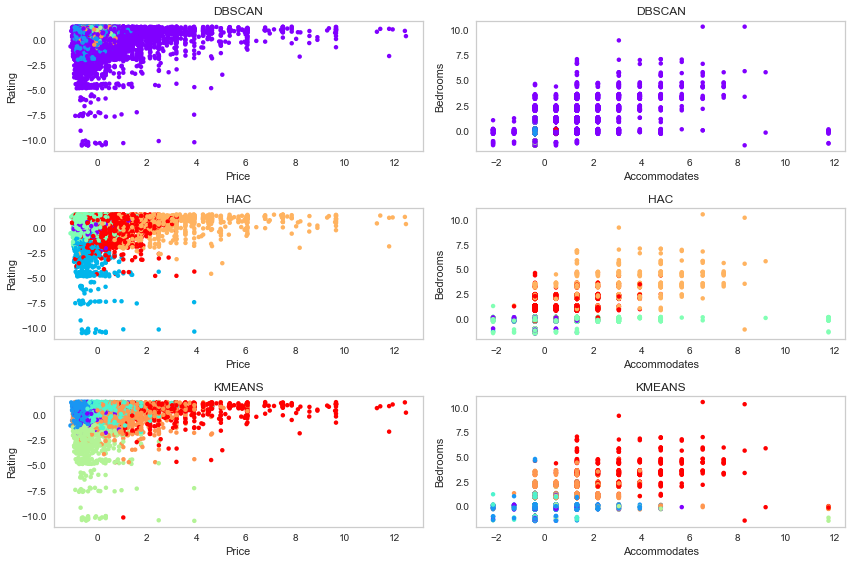

In [63]:
#from class example

from sklearn.cluster import AgglomerativeClustering
#Comparison of the Clustering
data = pdata_z

cls = DBSCAN(eps=0.99, min_samples=2)
cls.fit(data)
dbs_labels = modelDBSCAN.labels_ 

cls = AgglomerativeClustering(n_clusters=6, linkage='complete')
cls.fit(data)
hac_labels = clusters

cls = KMeans(n_clusters=6, random_state=12)
cls.fit(data)
kmn_labels = KNNModel.labels_

fig = plt.figure(figsize=(12,8))
title = ['DBSCAN','HAC','KMEANS']

for i,l in enumerate([dbs_labels,hac_labels,kmn_labels]):
    
    plt.subplot(3,2,2*i+1)
    plt.scatter(data.iloc[:, 7], data.iloc[:, 4]+np.random.random(data.iloc[:, 1].shape)/2, c=l, cmap=plt.cm.rainbow, s=20, linewidths=0)
    plt.xlabel('Price'), plt.ylabel('Rating')
    plt.grid()
    plt.title(title[i])
    
    plt.subplot(3,2,2*i+2)
    plt.scatter(data.iloc[:, 2], data.iloc[:, 5]+np.random.random(data.iloc[:, 1].shape)/2, c=l, cmap=plt.cm.rainbow, s=20, linewidths=0)
    plt.xlabel('Accommodates'), plt.ylabel('Bedrooms')
    plt.grid()
    plt.title(title[i])
    
    


plt.tight_layout()
plt.show()

### 3.6 Ramifications - Model and Evaluation 4

Cluster analyses can be performed in many ways, and it mainly depends on the data scientist's preferences and how they want to  approach the problem. There is no right or wrong way to perform a cluster analysis, but there are guidelines to follow depending on the type of cluster analysis. For instance, with K-Means Clustering, one could use the elbow method on the distortion score to determine the 'optimal' k clusters or use the silhouette score closest to 1. Due to these methods giving different 'optimal' k-clusters, the data scientist(s) have to make the decision on which to move forward with. Although having less clusters could be easier for interpretability, we felt as though having 6 clusters in the k-means clustering displayed stronger relationships in separability.

Hierarchical clustering analysis requires the scientist(s) to make arbitrary decisions such as where to draw the line on how many clusters we use based on multiple measures. When deciding which linkage method is best to use, we want to assess the cophenetic coefficient and use the value that is highest. When comparing the largest cophenetic coefficient linkage method to the lowest, we saw that the ward method gave us better separability within the cluster groups and should proceed with it even though the average linkage method had the highest cophenetic coefficient. We believe this is case-by-case and depends on how the instances mend in the analysis. Once we have our method chosen, we have to decide a cut-off for the number of clusters used by truncating at a distance which is displayed in the dendograms. For the ward linkage method, when we selected to cut off at 150 based on our team's perception of the best clustering option. Alongside these two clustering methods, we also use DBScan Clustering. This clustering method utilizes different metrics to create the clusters. For example, we use the 'eps' value and the minimum number of samples per cluster to find the best fit across the different clusters. 

Using the DBScan clustering analysis is the most data-driven decision-based method of the three. With these clustering methods having room for human error, one mistake could completely derail the analysis and give less efficient clustered groups for the tasks at hand. The best way to avoid these concerns is to dive deep in the data understanding. Our team is confident we have made the best decisions for our clustering analyses based on our experience with the data, as well as interpreting the clusters within each of the methods

### 4. Deployment

How will our chosen model be usable by other parties?
-      Our model does well to visualize how multiple features of an Airbnb rental affect each other. An Airbnb owner may be interested in using the results to set goals for some of the features. Such as aiming for higher number of reviews, and higher review scores to justify a price point of their property.
Did we achieve our goals?
-      Our goal was to provide insight into how different Airbnb features interacted with each other. We were able to group our data based off multiple parameters and analyze how these groups could be used to create better business understanding.
Can we reign in the utility of our modeling?
How useful is our model for interested parties?
-      Our model may not be useful for forecasting Airbnb data; however, it would be very useful to group Airbnb features together and make decisions based off the data found in the clusters.
How would we deploy our model for interested parties?
-      Our model could be deployed to Airbnb corporation to include as a feature for current property owners using their platform.
What other data should be collected?
-      Having some more physical features of the property could be beneficial. Things like square footage, year built, and number of floors could be features that can aid in clustering properties together and lead to better business understanding and decision making.
How often would the model need to be updated?
-      Our model would benefit from the most up to date information. Updating data at a minimum of every year would require our models to be refit each time as property values may sift.

### 5 Exceptional Work: K-Nearest Neighbors Classification

We incorporated the KNN Cluster attribute to our data and re-ran the KMEANS clustering task we conducted on the last project.

After comparing the accuracy and performance metrics of the model augmented with the cluster value, we determined that the accuracy of the classification task was worse when using CLUSTER as a regressor, than when we did not incporporate it at all.

In [64]:
#referenced in-class assignment

#transforming the property type to a binary classification
value_list = ["Apartment"]
boolean_series = ~pdata_cls.property_type.isin(value_list)
filtered_df = pdata_cls[boolean_series]

for i in list (filtered_df.index):
    pdata_cls.loc[i,'property_type'] = "other"

#transforming the longitude and latitude variables to East / West
pdata_cls["region"] = pd.cut(pdata_cls.longitude,[-200,-100,0],2,labels=["West","East"])

In [65]:
#Encoding boolean and categorical variables
replaceStruct = {
                "cleaning_fee":     {True: 1, False: 0},
                "instant_bookable":     {"t": 1, "f": 0},
                "host_identity_verified":     {"t": 1, "f": 0},
                "property_type":     {"Apartment": 0, "other": 1},
                }

pdata_cls=pdata_cls.replace(replaceStruct)

In [66]:
pdata_cls.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 17797 entries, 1 to 30735
Data columns (total 30 columns):
 #   Column                  Non-Null Count  Dtype   
---  ------                  --------------  -----   
 0   id                      17797 non-null  int64   
 1   log_price               17797 non-null  float64 
 2   property_type           17797 non-null  int64   
 3   room_type               17797 non-null  object  
 4   accommodates            17797 non-null  int64   
 5   bathrooms               17797 non-null  float64 
 6   bed_type                17797 non-null  object  
 7   cancellation_policy     17797 non-null  object  
 8   cleaning_fee            17797 non-null  int64   
 9   city                    17797 non-null  object  
 10  description             17797 non-null  object  
 11  first_review            17797 non-null  object  
 12  host_has_profile_pic    17797 non-null  object  
 13  host_identity_verified  17797 non-null  int64   
 14  host_response_rate    

In [67]:
oneHotCols=["room_type","bed_type","city","cancellation_policy",'region']
pdata_cls.drop(['description','host_response_rate','first_review','host_since', 'zipcode','last_review','id','neighbourhood','cleaning_fee','host_has_profile_pic','latitude','longitude','property_type_original'], axis=1, inplace=True)
pdata_cls=pd.get_dummies(pdata_cls, columns=oneHotCols,drop_first=True)
pdata_cls.head(10)

,log_price,property_type,accommodates,bathrooms,host_identity_verified,instant_bookable,number_of_reviews,review_scores_rating,bedrooms,beds,...,city_Chicago,city_DC,city_LA,city_NYC,city_SF,cancellation_policy_moderate,cancellation_policy_strict,cancellation_policy_super_strict_30,cancellation_policy_super_strict_60,region_East
1,5.129899,0,7,1.0,0,1,6,93.0,3.0,3.0,...,0,0,0,1,0,0,1,0,0,1
2,4.976734,0,5,1.0,1,1,10,92.0,1.0,3.0,...,0,0,0,1,0,1,0,0,0,1
4,4.744932,0,2,1.0,1,1,4,40.0,0.0,1.0,...,0,1,0,0,0,1,0,0,0,1
5,4.442651,0,2,1.0,1,1,3,100.0,1.0,1.0,...,0,0,0,0,1,0,1,0,0,0
7,4.787492,1,2,1.0,1,0,9,93.0,1.0,1.0,...,0,0,1,0,0,1,0,0,0,0
8,4.787492,1,2,1.0,0,0,159,99.0,1.0,1.0,...,0,0,0,0,1,1,0,0,0,0
10,4.605170,0,2,1.0,1,0,82,93.0,1.0,1.0,...,0,0,0,1,0,0,1,0,0,1
11,5.010635,1,4,1.5,1,0,29,97.0,2.0,2.0,...,0,0,1,0,0,0,1,0,0,0
13,5.298317,0,6,1.5,1,1,13,89.0,2.0,3.0,...,0,1,0,0,0,0,1,0,0,1
17,4.595120,1,2,2.0,1,0,12,88.0,1.0,1.0,...,0,0,0,0,0,0,1,0,0,1


In [68]:
pdata_cls.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 17797 entries, 1 to 30735
Data columns (total 28 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   log_price                            17797 non-null  float64
 1   property_type                        17797 non-null  int64  
 2   accommodates                         17797 non-null  int64  
 3   bathrooms                            17797 non-null  float64
 4   host_identity_verified               17797 non-null  int64  
 5   instant_bookable                     17797 non-null  int64  
 6   number_of_reviews                    17797 non-null  int64  
 7   review_scores_rating                 17797 non-null  float64
 8   bedrooms                             17797 non-null  float64
 9   beds                                 17797 non-null  float64
 10  price                                17797 non-null  float64
 11  KCLUSTER                    

In [69]:
# Creating the X and y variables for the Classification Model
X_cls = pdata_cls.drop('property_type',axis=1).values     
y_cls = pdata_cls['property_type'].values

#Scaling the Classification input
yhat_cls = np.zeros(y_cls.shape) # we will fill this with predictions
scl_cls = StandardScaler()
X_scaled_cls = scl_cls.fit_transform(X_cls)

In [70]:
cv = StratifiedShuffleSplit(n_splits=10, test_size = 0.2, train_size = 0.8, random_state=42)

for trainidx, testidx in cv.split(X_scaled_cls,y_cls):
    # note that these are sparse matrices
    X_train_scaled_cls = X_scaled_cls[trainidx]
    X_test_scaled_cls = X_scaled_cls[testidx]
    y_train_cls = y_cls[trainidx]
    y_test_cls = y_cls[testidx]

In [71]:
get_ipython().run_line_magic('time', '')
from sklearn.pipeline import make_pipeline
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import ShuffleSplit
from sklearn.pipeline import Pipeline

Wall time: 0 ns


In [72]:
#pipe = make_pipeline(('scale', StandardScaler()),  ('knn', KNeighborsClassifier()))

pipe = Pipeline([('scale', StandardScaler()),  
                         ('knn', KNeighborsClassifier())]) 

# Define a range of hyper parameters for grid search
parameters = { 'knn__n_neighbors': [10,45,50]
              , 'knn__algorithm' : ["auto", "ball_tree", "kd_tree", "brute"]
             }

#Perform the grid search using accuracy as a metric during cross validation.
gridKnn = GridSearchCV(pipe, parameters, cv=cv, scoring='accuracy') # can try f1_micro, f1_maco accuracy....

#Use the best features from recursive feature elimination during the grid search
gridKnn.fit(X_train_scaled_cls, y_train_cls)

#display the best pipeline model identified during the grid search
gridKnn.best_estimator_

Pipeline(steps=[('scale', StandardScaler()),
                ('knn', KNeighborsClassifier(n_neighbors=45))])

In [73]:
gridKnn.best_params_

{'knn__algorithm': 'auto', 'knn__n_neighbors': 45}

In [74]:
KNNmodelFINAL = KNeighborsClassifier(algorithm = 'auto', n_neighbors = 45) # get object
KNNmodelFINAL.fit(X_train_scaled_cls, y_train_cls)
KNNy_hat = KNNmodelFINAL.predict(X_test_scaled_cls)

In [75]:
from sklearn.model_selection import cross_val_score
KNNaccuracies = cross_val_score(KNNmodelFINAL, X_scaled_cls, y=y_cls, cv=cv) # this also can help with parallelism
print(KNNaccuracies)

[0.73286517 0.71910112 0.73988764 0.73820225 0.72865169 0.73033708
 0.74466292 0.72865169 0.74016854 0.73398876]


Training accuracy 0.745

Testing accuracy 0.734

Confusion Matrix


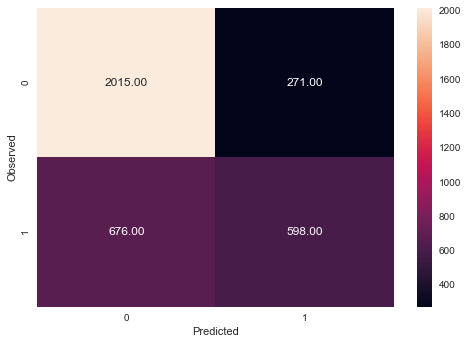

None
              precision    recall  f1-score   support

           0       0.75      0.88      0.81      2286
           1       0.69      0.47      0.56      1274

    accuracy                           0.73      3560
   macro avg       0.72      0.68      0.68      3560
weighted avg       0.73      0.73      0.72      3560



In [76]:
from sklearn.metrics import classification_report, confusion_matrix

## function to get confusion matrix in a proper format
def draw_cm( actual, predicted ):
    cm = confusion_matrix( actual, predicted)
    sns.heatmap(cm, annot=True,  fmt='.2f', xticklabels = [0,1] , yticklabels = [0,1] )
    plt.ylabel('Observed')
    plt.xlabel('Predicted')
    plt.show()

print("Training accuracy",round(KNNmodelFINAL.score(X_train_scaled_cls,y_train_cls),ndigits=3))
print()
print("Testing accuracy",round(mt.accuracy_score(y_test_cls, KNNy_hat),ndigits=3))
print()
print('Confusion Matrix')
print(draw_cm(y_test_cls,KNNy_hat))

print(classification_report(y_test_cls,KNNy_hat))

In [77]:
KNN_ac = round(mt.accuracy_score(y_test_cls, KNNy_hat),ndigits=3)

print(KNN_ac)

0.734
